# SIBUR competition

![image.png](data/plant.png)

### Термохимическое уравнение целевой реакции:
### C2H6→C2H4 + H2 – 207 кДж

https://sibur.ai-community.com/competitions/1  - описание 

https://sibur.ai-community.com/competitions/1/tasks/1/rating - список целей

In [23]:
# Импорт нужных библиотек и настройка глобальных параметров ноутбука
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
import bokeh
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from featexp import get_univariate_plots
from featexp import get_trend_stats

%matplotlib inline
pd.set_option('display.max_columns', 500)
plt.rcParams['figure.figsize'] = (10,3)

targets = ['target', 'target2', 'target3', 'target4', 'target5']

In [2]:
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import TimeSeriesSplit

def validation_score(val_data, predicted):
    tscv = TimeSeriesSplit(n_splits=10)
    scores=[]
    for train_ind, test_ind in tscv.split(val_data):
        pred = predicted.iloc[test_ind]

        score = MSE(val_data.iloc[test_ind], pred)**0.5
        scores.append(score)
        print('train len: ', len(train_ind), '\t till ', val_data.index[train_ind[-1]]  ,'\t score: ' , score)

    print('average score: ', np.mean(scores))
    return np.mean(scores)

def scale_dataframe(df, scaler):
    # scale df with scaler
    columns = df.columns
    index = df.index
    scaled_df = pd.DataFrame(scaler.transform(df), columns=columns, index=index)
    
    return scaled_df 

In [3]:
# 1. read raw data
sensors = pd.read_csv('data/sensors.csv', parse_dates=['timestamp'], index_col='timestamp')
coke = pd.read_csv('data/coke_target.csv', parse_dates=['timestamp'], index_col='timestamp')
reactor_pressure = pd.read_csv('data/reactor_pressure_target.csv', parse_dates=['timestamp'], index_col='timestamp')

temp_on_he = pd.read_csv('data/temp_on_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
pressure_he = pd.read_csv('data/pressure_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
activity = pd.read_csv('data/activity_target.csv', parse_dates=['timestamp'], index_col='timestamp')


reactor_pressure.columns = ['target2']
temp_on_he.columns = ['target3']
pressure_he.columns = ['target4']
activity.columns = ['target5']

#print (sensors.info(), '\n')
#print (coke.info())

In [4]:
pd.set_option('display.max_colwidth', 150)
feature_names = pd.read_csv('data/tags.csv', index_col='feature')
feature_names

,description,units
feature,,
f_0,Установка ректификации. Синтез. Массовая доля этана,% (массовая доля)
f_1,Установка ректификации. Синтез. Массовая доля этилена (поток 1),% (массовая доля)
f_2,Установка ректификации. Синтез. Массовая доля этилена (поток 2),% (массовая доля)
f_3,Синтез. Установка ректификации. Содержание компонента 1 в этане,% (массовая доля)
f_4,Синтез. Установка ректификации. Содержание компонента 2 в этане,% (массовая доля)
f_5,Синтез. Установка ректификации. Содержание компонента 3 в этане,% (массовая доля)
f_6,Синтез. Установка ректификации. Содержание компонента 4 в этане,% (массовая доля)
f_7,Синтез. Установка ректификации. Содержание суммы тяжелых углеводородов в этане,% (массовая доля)
f_8,Синтез. Установка дегидрирования. Расход этана от фильтров сырья в узле сепарации (поток А),кг/ч


In [17]:
# 2. merge to one dataframe
merged_df = pd.merge(sensors, coke, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, reactor_pressure, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, temp_on_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, pressure_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, activity, on='timestamp', how='outer')
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13272 entries, 2016-10-24 16:00:00 to 2018-04-30 15:00:00
Data columns (total 53 columns):
f_0        584 non-null float64
f_1        576 non-null float64
f_2        580 non-null float64
f_3        13241 non-null float64
f_4        13084 non-null float64
f_5        13266 non-null float64
f_6        13260 non-null float64
f_7        13244 non-null float64
f_8        13266 non-null float64
f_9        13266 non-null float64
f_10       13266 non-null float64
f_11       13266 non-null float64
f_12       13266 non-null float64
f_13       13266 non-null float64
f_14       13266 non-null float64
f_15       13266 non-null float64
f_16       13266 non-null float64
f_17       13266 non-null float64
f_18       13266 non-null float64
f_19       13266 non-null float64
f_20       13266 non-null float64
f_21       13178 non-null float64
f_22       13266 non-null float64
f_23       13267 non-null float64
f_24       13266 non-null float64
f_25       1

In [18]:
# split to train and test data
full_df = merged_df.fillna(method='ffill').fillna(method='bfill')

In [11]:
width = 490
height = 200
scaler = MinMaxScaler()

df = scale_dataframe(train, scaler.fit(train))
graph1 = df.f_0.hvplot(width = width, height = height) + df.target3.hvplot(width = width, height = height) + \
        df.target.hvplot(width = width, height = height) + df.target4.hvplot(width = width, height = height) + \
        df.target2.hvplot(width = width, height = height) + df.target5.hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.F_0     :Curve   [timestamp]   (f_0)
   .Curve.Target3 :Curve   [timestamp]   (target3)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Target4 :Curve   [timestamp]   (target4)
   .Curve.Target2 :Curve   [timestamp]   (target2)
   .Curve.Target5 :Curve   [timestamp]   (target5)

In [33]:
df = scale_dataframe(full_df, scaler)
start_col = 12
feat_to_draw = ['target'] + df.columns[start_col:start_col + 7].tolist()

graph1 = df.target.hvplot(width = width, height = height)
for col in feat_to_draw[1:]:
    graph1 += df[col].hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.Target :Curve   [timestamp]   (target)
   .Curve.F_12   :Curve   [timestamp]   (f_12)
   .Curve.F_13   :Curve   [timestamp]   (f_13)
   .Curve.F_14   :Curve   [timestamp]   (f_14)
   .Curve.F_15   :Curve   [timestamp]   (f_15)
   .Curve.F_16   :Curve   [timestamp]   (f_16)
   .Curve.F_17   :Curve   [timestamp]   (f_17)
   .Curve.F_18   :Curve   [timestamp]   (f_18)

C:\Progs\Anaconda2\envs\Tensor\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


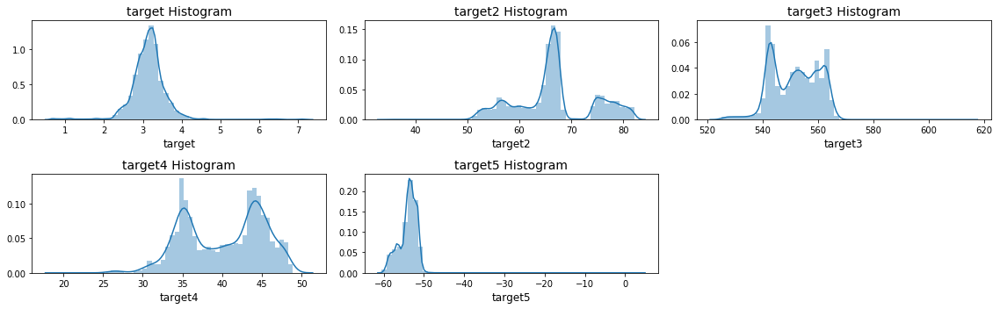

In [11]:
plt.figure(figsize=(16,5))
for i, tar in enumerate(targets):
    sns.distplot(df[tar].values, bins=50, kde=True, ax = plt.subplot(2, 3, i+1))
    plt.xlabel(tar, fontsize=12)
    plt.title(tar + ' Histogram', fontsize=14)

plt.tight_layout()
plt.show()

In [12]:
train.describe()

,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,target,target2,target3,target4,target5
count,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000,10400.000000
mean,99.106368,0.240266,26.415687,0.089542,2.995086,0.027157,0.315644,4.779121,217040.769331,218824.329665,216630.268678,9781.977515,9721.221422,9979.389661,49.909587,117.194029,126.425373,41.582123,104.809982,126.152812,633.701815,624.563016,40.864007,104.483959,126.317529,626.847711,39.242628,104.814705,618.173858,610.779349,606.967174,635.871492,102.535286,8.311654,8.225344,8.207855,20.373032,25.906365,22.623841,12.345818,0.240884,0.143222,0.104309,9962.997297,217145.827521,9612.712497,188.464317,58611.252418,3.159007,66.566689,551.516103,40.209477,-53.845738
std,0.417514,0.109603,2.746131,1.460706,3.865860,0.292438,0.474183,9.152470,38843.968178,39153.865434,38742.055013,1931.803447,1929.867462,1964.726693,10.817331,21.064843,22.750097,7.721134,18.449702,23.544224,48.908097,104.641982,7.481875,18.622655,23.142261,105.768387,7.343551,18.855371,45.572762,102.633061,43.225652,49.531128,28.836102,1.822807,1.917320,1.768643,15.473431,13.791781,15.492499,21.422502,0.282125,2.824755,1.974769,1963.298484,39396.923926,1993.324695,949.336918,13290.558595,0.506231,7.530406,8.446319,4.977141,2.734828
min,92.756623,0.003901,0.454774,-0.049504,-0.089998,-0.081726,-0.155299,-13.312292,-2000.516934,-1820.834828,-2207.501108,-163.873745,-166.952597,-158.217016,-9.099631,-1.090329,-1.592890,-0.472611,-0.417572,-1.787298,393.556898,2.123765,-0.286598,-2.201357,-0.916256,2.351833,-0.278215,-7.027282,385.602890,2.227581,389.912767,379.814331,-1.025175,-0.073680,-0.037912,-0.076208,-0.109693,-0.073805,-0.106910,-0.288872,0.069926,-0.100009,-0.051669,-94.490772,-1873.924198,-88.228769,-7.004686,-606.554446,0.641468,34.831093,525.240765,20.214696,-60.534703
25%,99.004606,0.193783,26.026412,-0.007559,0.532627,-0.013048,-0.006239,0.549148,213131.907513,214928.816373,212967.154445,9785.243481,9691.215446,9972.931734,46.398475,118.393983,130.634878,41.870787,106.329767,130.549846,643.639558,644.320485,41.903921,106.655478,130.673023,647.522166,40.129677,106.317133,625.131234,630.115283,614.439867,642.870969,69.871239,8.143193,8.013831,8.111981,11.488115,18.008771,13.745869,-0.036758,0.075859,-0.012116,-0.007124,9952.027058,213070.147655,9510.325895,3.440448,58396.978969,2.927230,62.639397,543.578430,35.490688,-54.949674
50%,99.168132,0.244712,26.652086,0.000945,2.487767,0.002358,0.037836,3.750713,228576.571130,230571.226891,228137.469352,10332.944789,10294.103282,10543.492608,51.731090,120.673674,130.991958,42.068631,108.855188,130.961909,644.507174,645.812652,42.023825,108.322320,130.972897,648.545157,40.986935,108.381143,627.851607,631.573087,616.177241,646.571264,118.818695,8.748920,8.729111,8.576226,11.488115,18.008771,13.745869,-0.036758,0.075859,0.003991,0.006200,10535.868585,229012.845043,10320.003492,6.321777,62208.928172,3.158355,66.330479,551.932702,41.001483,-53.557323
75%,99.289177,0.291343,27.197639,0.010280,4.409330,0.019335,0.698536,7.025487,235169.805769,237093.523480,234676.817755,10484.245474,10418.100277,10703.331129,56.199951,123.318294,131.335051,42.579106,109.144693,131.350767,645.3

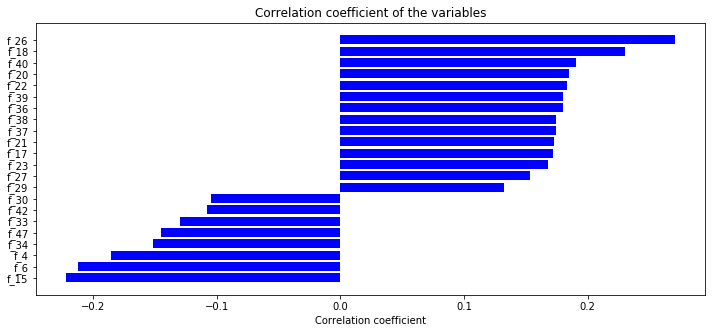

In [35]:
from scipy.stats import spearmanr
import warnings
warnings.filterwarnings("ignore")

labels = []
values = []
for col in df.drop(targets, axis=1).columns:
    labels.append(col)
    values.append(spearmanr(df[col].values, df['target'].values)[0])
corr_df = pd.DataFrame({'col_labels':labels, 'corr_values':values})
corr_df = corr_df.sort_values(by='corr_values')
 
corr_df = corr_df[(corr_df['corr_values']>0.1) | (corr_df['corr_values']<-0.1)]
ind = np.arange(corr_df.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(12,5))
rects = ax.barh(ind, np.array(corr_df.corr_values.values), color='b')
ax.set_yticks(ind)
ax.set_yticklabels(corr_df.col_labels.values, rotation='horizontal')
ax.set_xlabel("Correlation coefficient")
ax.set_title("Correlation coefficient of the variables")
plt.show()

correlated_features = corr_df.col_labels.tolist()

Now lets predict mean average value for target on test data

In [23]:
plt.figure(figsize=(16,5))
grid = (hv.Points((df['f_14'], df.target), label='f_14'))
for i, col in enumerate(df.columns[15:26]):
    grid += hv.Points((df[col], df.target), label=col)

grid.cols(3)

:Layout
   .Points.F_14 :Points   [x,y]
   .Points.F_15 :Points   [x,y]
   .Points.F_16 :Points   [x,y]
   .Points.F_17 :Points   [x,y]
   .Points.F_18 :Points   [x,y]
   .Points.F_19 :Points   [x,y]
   .Points.F_20 :Points   [x,y]
   .Points.F_21 :Points   [x,y]
   .Points.F_22 :Points   [x,y]
   .Points.F_23 :Points   [x,y]
   .Points.F_24 :Points   [x,y]
   .Points.F_25 :Points   [x,y]

<Figure size 1152x360 with 0 Axes>

In [ ]:
#common_df = pd.concat([train, test])
train['target_pred'] = train.target.mean()
test['target_pred'] = train.target.mean()
pred_df = pd.DataFrame(pd.concat([train.target, test.target_pred]), columns=['target'])
pred_df['rolling_mean'] = train['target_pred']
pred_df.hvplot()

In [ ]:
validation_score(train['target'], train['target_pred'])

In [ ]:
# Making a submission file #
sub_df = pred_df['2018':]
#sub_df['target_pred'] = pred

print('Submision length: ', len(sub_df))
#sub_df['target'].to_csv("baseline_mean_average.csv", index=True, header=True)

# 0.5144 оценка  RMSE
# 0.4410618592481069 - my validation